## GeoPandas e Visualizações

In [1]:
#Importações

import folium
import geopandas as gpd
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from folium import plugins
from shapely.geometry import Point

from Apoio.config import DADOS_LIMPOS, DADOS_GEO_ORIGINAIS, DADOS_GEO_MEDIAN
from Apoio.graficos import SCATTER_ALPHA, PALETTE

import warnings
warnings.filterwarnings("ignore")

sns.set_theme(palette="bright", style="white")

#### Checagens básicas

In [2]:
df = pd.read_parquet(DADOS_LIMPOS)
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room
0,-122.23,37.88,41,880,129,322,126,8.3252,452600,NEAR BAY,5,6.984127,2.555556,0.146591
1,-122.22,37.86,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,5,6.238137,2.109842,0.155797
2,-122.26,37.84,42,2555,665,1206,595,2.0804,226700,NEAR BAY,2,4.294118,2.026891,0.260274
3,-122.26,37.85,50,1120,283,697,264,2.1250,140000,NEAR BAY,2,4.242424,2.640152,0.252679
4,-122.26,37.84,50,2239,455,990,419,1.9911,158700,NEAR BAY,2,5.343675,2.362768,0.203216


In [3]:
df.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room
17559,-121.09,39.48,25,1665,374,845,330,1.5603,78100,INLAND,2,5.045455,2.560606,0.224625
17560,-121.21,39.49,18,697,150,356,114,2.5568,77100,INLAND,2,6.114035,3.122807,0.215208
17561,-121.22,39.43,17,2254,485,1007,433,1.7000,92300,INLAND,2,5.205543,2.325635,0.215173
17562,-121.32,39.43,18,1860,409,741,349,1.8672,84700,INLAND,2,5.329513,2.123209,0.219892
17563,-121.24,39.37,16,2785,616,1387,530,2.3886,89400,INLAND,2,5.254717,2.616981,0.221185


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17564 entries, 0 to 17563
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  int64   
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-null  floa

#### Criando um GeoDataframe para o DataFrame que já temos

O GeoDataframe é uma extensão do Pandas para dados espaciais, como o DataFrame base é sobre condados do estado da Califórnia, sua utilização será útil para a visualização de mapas que surgirão adiante.

In [5]:
gdf_counties = gpd.read_file(DADOS_GEO_ORIGINAIS)

gdf_counties.head()

,name,fullname,abbrev,abcode,ansi,geometry
0,Siskiyou,Siskiyou County,SIS,c047,093,"POLYGON ((-121.44597 41.1839, -121.46238 41.18..."
1,Del Norte,Del Norte County,DNT,c008,015,"MULTIPOLYGON (((-124.19097 41.73619, -124.1933..."
2,Modoc,Modoc County,MOD,c025,049,"POLYGON ((-121.44784 41.99739, -121.42322 41.9..."
3,Trinity,Trinity County,TRI,c053,105,"POLYGON ((-122.66795 40.77637, -122.66814 40.7..."
4,Shasta,Shasta County,SHA,c045,089,"POLYGON ((-122.17328 40.37906, -122.17359 40.3..."


Podemos notar novas colunas:
- name
- fullname
- abbrev
- abcode
- ansi
- geometry

**abcode**: Refere-se a um código de fronteira administrativa, usado para identificar divisões geográficas ou administrativas específicas, como estados, cidades ou condados.

**ansi**: Refere-se a códigos padronizados pelo ANSI, usados principalmente nos EUA para identificar estados e condados. Esses códigos são uma forma de identificar regiões geográficas de maneira única e padronizada.

#### Criando um sistema de pontos para uma coluna de geometria espacial

In [6]:
pontos = [Point(long, lat) for long, lat in zip(df["longitude"], df["latitude"])]
pontos[:5]

[<POINT (-122.23 37.88)>,
 <POINT (-122.22 37.86)>,
 <POINT (-122.26 37.84)>,
 <POINT (-122.26 37.85)>,
 <POINT (-122.26 37.84)>]

In [7]:
gdf_base = gpd.GeoDataFrame(df, geometry=pontos)
gdf_base.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room,geometry
0,-122.23,37.88,41,880,129,322,126,8.3252,452600,NEAR BAY,5,6.984127,2.555556,0.146591,POINT (-122.23 37.88)
1,-122.22,37.86,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,5,6.238137,2.109842,0.155797,POINT (-122.22 37.86)
2,-122.26,37.84,42,2555,665,1206,595,2.0804,226700,NEAR BAY,2,4.294118,2.026891,0.260274,POINT (-122.26 37.84)
3,-122.26,37.85,50,1120,283,697,264,2.1250,140000,NEAR BAY,2,4.242424,2.640152,0.252679,POINT (-122.26 37.85)
4,-122.26,37.84,50,2239,455,990,419,1.9911,158700,NEAR BAY,2,5.343675,2.362768,0.203216,POINT (-122.26 37.84)


In [8]:
gdf_base.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 17564 entries, 0 to 17563
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  int64   
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-nu

#### Checando e atribuindo o CRS certo

Um Sistema de Referência de Coordenadas **(CRS)** define como dados geográficos são posicionados na Terra. É como uma “linguagem” que traduz coordenadas em locais reais no mapa.

Essas coordenadas podem estar em latitude/longitude ou em medidas como metros, dependendo do sistema utilizado.

O padrão mais comum é o **WGS 84**, usado globalmente (inclusive em GPS), e identificado pelo código **EPSG:4326**, que indica coordenadas em graus (latitude e longitude).

Em projetos locais, outros sistemas podem ser usados para reduzir distorções. Quando diferentes arquivos usam CRSs distintos, é necessário convertê-los para garantir que se alinhem corretamente.

Como a Terra é curva e os mapas são planos, entram em cena as projeções cartográficas, que transformam essa superfície em um plano, sempre com algum nível de distorção. Cada projeção prioriza aspectos diferentes, como áreas, formas ou distâncias.

O CRS define onde os pontos estão na Terra, enquanto a projeção cartográfica define como esses pontos são representados no mapa.

In [9]:
gdf_base.crs

O **gdf_base** não possui **CRS** definido, então teremos que atribuir o mesmo do **gdf_counties** para ele:

In [10]:
gdf_counties.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [11]:
gdf_base = gdf_base.set_crs(epsg=4326)

In [12]:
gdf_base.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

#### Vamos unir os 2 GeoDataframes em um só

In [13]:
gdf_joined = gpd.sjoin(gdf_base, gdf_counties, how="left", predicate="within")
gdf_joined.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,...,rooms_per_household,population_per_household,bedrooms_per_room,geometry,index_right,name,fullname,abbrev,abcode,ansi
0,-122.23,37.88,41,880,129,322,126,8.3252,452600,NEAR BAY,...,6.984127,2.555556,0.146591,POINT (-122.23 37.88),34.0,Alameda,Alameda County,ALA,c001,001
1,-122.22,37.86,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,...,6.238137,2.109842,0.155797,POINT (-122.22 37.86),34.0,Alameda,Alameda County,ALA,c001,001
2,-122.26,37.84,42,2555,665,1206,595,2.0804,226700,NEAR BAY,...,4.294118,2.026891,0.260274,POINT (-122.26 37.84),34.0,Alameda,Alameda County,ALA,c001,001
3,-122.26,37.85,50,1120,283,697,264,2.1250,140000,NEAR BAY,...,4.242424,2.640152,0.252679,POINT (-122.26 37.85),34.0,Alameda,Alameda County,ALA,c001,001
4,-122.26,37.84,50,2239,455,990,419,1.9911,158700,NEAR BAY,...,5.343675,2.362768,0.203216,POINT (-122.26 37.84),34.0,Alameda,Alameda County,ALA,c001,001


In [14]:
gdf_joined.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,...,rooms_per_household,population_per_household,bedrooms_per_room,geometry,index_right,name,fullname,abbrev,abcode,ansi
17559,-121.09,39.48,25,1665,374,845,330,1.5603,78100,INLAND,...,5.045455,2.560606,0.224625,POINT (-121.09 39.48),12.0,Yuba,Yuba County,YUB,c058,115
17560,-121.21,39.49,18,697,150,356,114,2.5568,77100,INLAND,...,6.114035,3.122807,0.215208,POINT (-121.21 39.49),12.0,Yuba,Yuba County,YUB,c058,115
17561,-121.22,39.43,17,2254,485,1007,433,1.7000,92300,INLAND,...,5.205543,2.325635,0.215173,POINT (-121.22 39.43),12.0,Yuba,Yuba County,YUB,c058,115
17562,-121.32,39.43,18,1860,409,741,349,1.8672,84700,INLAND,...,5.329513,2.123209,0.219892,POINT (-121.32 39.43),12.0,Yuba,Yuba County,YUB,c058,115
17563,-121.24,39.37,16,2785,616,1387,530,2.3886,89400,INLAND,...,5.254717,2.616981,0.221185,POINT (-121.24 39.37),12.0,Yuba,Yuba County,YUB,c058,115


In [15]:
gdf_joined.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 17564 entries, 0 to 17563
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  int64   
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-null  f

#### Eliminando colunas desnecessárias para as projeções

In [16]:
gdf_joined = gdf_joined.drop(columns=["index_right", "fullname", "abcode", "ansi"])
gdf_joined.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room,geometry,name,abbrev
0,-122.23,37.88,41,880,129,322,126,8.3252,452600,NEAR BAY,5,6.984127,2.555556,0.146591,POINT (-122.23 37.88),Alameda,ALA
1,-122.22,37.86,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,5,6.238137,2.109842,0.155797,POINT (-122.22 37.86),Alameda,ALA
2,-122.26,37.84,42,2555,665,1206,595,2.0804,226700,NEAR BAY,2,4.294118,2.026891,0.260274,POINT (-122.26 37.84),Alameda,ALA
3,-122.26,37.85,50,1120,283,697,264,2.1250,140000,NEAR BAY,2,4.242424,2.640152,0.252679,POINT (-122.26 37.85),Alameda,ALA
4,-122.26,37.84,50,2239,455,990,419,1.9911,158700,NEAR BAY,2,5.343675,2.362768,0.203216,POINT (-122.26 37.84),Alameda,ALA


In [17]:
gdf_joined.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 17564 entries, 0 to 17563
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  int64   
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-null  f

#### Verificando as colunas nulas e colocando dentro de uma variável

In [18]:
gdf_joined[gdf_joined.isnull().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room,geometry,name,abbrev
1507,-124.30,41.80,19,2672,552,1298,478,1.9797,85800,NEAR OCEAN,2,5.589958,2.715481,0.206587,POINT (-124.3 41.8),NaN,NaN
1508,-124.23,41.75,11,3159,616,1343,479,2.4805,73200,NEAR OCEAN,2,6.594990,2.803758,0.194998,POINT (-124.23 41.75),NaN,NaN
1511,-124.22,41.73,28,3003,699,1530,653,1.7038,78300,NEAR OCEAN,2,4.598775,2.343032,0.232767,POINT (-124.22 41.73),NaN,NaN
1517,-124.30,41.84,17,2677,531,1244,456,3.0313,103600,NEAR OCEAN,3,5.870614,2.728070,0.198356,POINT (-124.3 41.84),NaN,NaN
1521,-119.94,38.96,20,1451,386,467,255,1.5536,212500,INLAND,2,5.690196,1.831373,0.266023,POINT (-119.94 38.96),NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17198,-119.30,34.27,17,1527,503,688,423,1.6007,187500,NEAR OCEAN,2,3.609929,1.626478,0.329404,POINT (-119.3 34.27),NaN,NaN
17199,-119.29,34.26,32,3295,764,1344,600,3.6007,395500,NEAR OCEAN,3,5.491667,2.240000,0.231866,POINT (-119.29 34.26),NaN,NaN
17201,-119.29,34.23,22,2486,608,709,523,2.9018,275000,NEAR OCEAN,2,4.753346,1.355641,0.244570,POINT (-119.29 34.23),NaN,NaN
17232,-119.23,34.15,18,6213,1188,2679,1000,3.7480,380400,NEAR OCEAN,3,6.213000,2.679000,0.191212,POINT (-119.23 34.15),NaN,NaN


In [19]:
linhas_nulas = gdf_joined[gdf_joined.isnull().any(axis=1)].index
linhas_nulas

Index([ 1507,  1508,  1511,  1517,  1521,  2154,  2193,  2201,  2203,  2219,
       ...
       15747, 15748, 15752, 15755, 15756, 17198, 17199, 17201, 17232, 17258],
      dtype='int64', length=148)

#### Criação de um centroide

O **centroide** é o ponto que representa o “centro” de uma área geográfica, como um município ou estado, mesmo quando o formato é irregular.

Ele é calculado a partir das coordenadas da geometria, funcionando como uma espécie de ponto médio.

No **GeoPandas**, o centroide pode ser obtido com `.centroid` e é muito útil para simplificar análises espaciais. Com ele, é possível, por exemplo, posicionar marcadores em mapas, comparar distâncias entre regiões ou representar áreas complexas de forma mais prática e intuitiva.

In [20]:
gdf_counties["centroid"] = gdf_counties.centroid
gdf_counties.head()

,name,fullname,abbrev,abcode,ansi,geometry,centroid
0,Siskiyou,Siskiyou County,SIS,c047,093,"POLYGON ((-121.44597 41.1839, -121.46238 41.18...",POINT (-122.54047 41.59268)
1,Del Norte,Del Norte County,DNT,c008,015,"MULTIPOLYGON (((-124.19097 41.73619, -124.1933...",POINT (-123.89681 41.74299)
2,Modoc,Modoc County,MOD,c025,049,"POLYGON ((-121.44784 41.99739, -121.42322 41.9...",POINT (-120.72517 41.58987)
3,Trinity,Trinity County,TRI,c053,105,"POLYGON ((-122.66795 40.77637, -122.66814 40.7...",POINT (-123.11264 40.65063)
4,Shasta,Shasta County,SHA,c045,089,"POLYGON ((-122.17328 40.37906, -122.17359 40.3...",POINT (-122.04016 40.76344)


#### Criação de uma função para tratar das linhas com valores nulos

In [21]:
def condado_mais_proximo(linha):
    ponto = linha["geometry"]
    distancias = gdf_counties["centroid"].distance(ponto)
    idx_condado_mais_proximo = distancias.idxmin()
    condado_mais_proximo = gdf_counties.loc[idx_condado_mais_proximo]

    return condado_mais_proximo[["name", "abbrev"]]

In [22]:
gdf_joined.loc[linhas_nulas, ["name", "abbrev"]] = gdf_joined.loc[linhas_nulas].apply(condado_mais_proximo, axis=1)

In [23]:
gdf_joined.isnull().sum()

longitude                   0
latitude                    0
housing_median_age          0
total_rooms                 0
total_bedrooms              0
population                  0
households                  0
median_income               0
median_house_value          0
ocean_proximity             0
median_income_cat           0
rooms_per_household         0
population_per_household    0
bedrooms_per_room           0
geometry                    0
name                        0
abbrev                      0
dtype: int64

Como visto, a função substituiu todos os valores nulos, pelos condados mais próximos de cada ponto

#### Criação de um mapa do gdf_counties com longitude e latitude

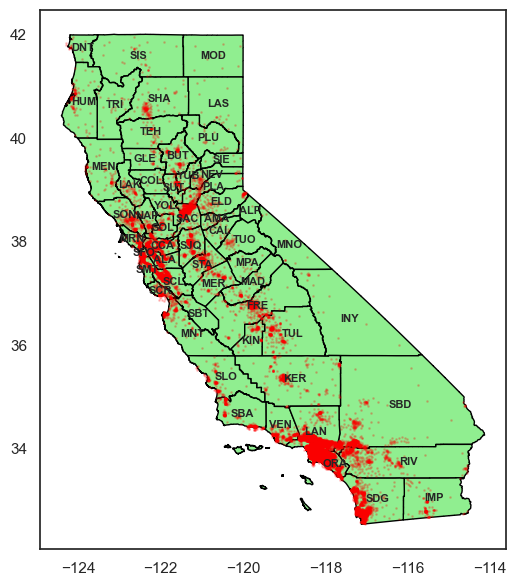

In [24]:
fig, ax = plt.subplots(figsize=(10, 7))

gdf_counties.plot(ax=ax, edgecolor="black", color="lightgreen")
ax.scatter(gdf_joined["longitude"], gdf_joined["latitude"], color="red", s=1, alpha=SCATTER_ALPHA)

for x, y, abbrev in zip(gdf_counties["centroid"].x, gdf_counties["centroid"].y, gdf_counties["abbrev"]):
    ax.text(x, y, abbrev, fontsize=8, ha="center", va="center", fontweight="bold")

plt.show()

#### Enriquecendo o gdf_counties com estatísticas calculadas a partir do gdf_joined

In [25]:
gdf_counties = gdf_counties.merge(gdf_joined.groupby("name").median(numeric_only=True), left_on="name", right_index=True)

O que foi feito acima?

- Agrupando dados por condado (name)
- Calculando a mediana das variáveis numéricas
- Juntando isso no gdf_counties

In [26]:
gdf_counties.head()

,name,fullname,abbrev,abcode,ansi,geometry,centroid,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room
0,Siskiyou,Siskiyou County,SIS,c047,093,"POLYGON ((-121.44597 41.1839, -121.46238 41.18...",POINT (-122.54047 41.59268),-122.545,41.615,23.0,2372.0,482.0,1111.0,427.0,2.17525,63950.0,2.0,5.848730,2.534146,0.201014
1,Del Norte,Del Norte County,DNT,c008,015,"MULTIPOLYGON (((-124.19097 41.73619, -124.1933...",POINT (-123.89681 41.74299),-124.170,41.765,19.0,2705.5,560.5,1290.0,486.5,2.22895,76650.0,2.0,5.523724,2.721776,0.207599
2,Modoc,Modoc County,MOD,c025,049,"POLYGON ((-121.44784 41.99739, -121.42322 41.9...",POINT (-120.72517 41.58987),-120.530,41.575,22.0,2472.0,473.5,860.5,349.5,2.18775,50250.0,2.0,6.891731,2.537227,0.197889
3,Trinity,Trinity County,TRI,c053,105,"POLYGON ((-122.66795 40.77637, -122.66814 40.7...",POINT (-123.11264 40.65063),-123.125,40.640,18.5,954.0,211.5,369.5,154.0,1.90705,77100.0,2.0,6.116148,2.541760,0.225996
4,Shasta,Shasta County,SHA,c045,089,"POLYGON ((-122.17328 40.37906, -122.17359 40.3...",POINT (-122.04016 40.76344),-122.350,40.570,19.0,2251.0,463.0,1077.0,412.0,2.40790,85200.0,2.0,5.487129,2.714097,0.198684


#### Descobrindo a Moda (valor mais comum) de ocean_promity

In [27]:
counties_ocean_prox = gdf_joined[["name", "ocean_proximity"]].groupby("name").agg(pd.Series.mode)
counties_ocean_prox

,ocean_proximity
name,
Alameda,NEAR BAY
Alpine,INLAND
Amador,INLAND
Butte,INLAND
Calaveras,INLAND
Colusa,INLAND
Contra Costa,NEAR BAY
Del Norte,NEAR OCEAN
El Dorado,INLAND


#### Adicionando a variável anterior ao gdf_counties

In [28]:
gdf_counties = gdf_counties.merge(counties_ocean_prox, left_on="name", right_index=True)
gdf_counties.head()

,name,fullname,abbrev,abcode,ansi,geometry,centroid,longitude,latitude,housing_median_age,...,total_bedrooms,population,households,median_income,median_house_value,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room,ocean_proximity
0,Siskiyou,Siskiyou County,SIS,c047,093,"POLYGON ((-121.44597 41.1839, -121.46238 41.18...",POINT (-122.54047 41.59268),-122.545,41.615,23.0,...,482.0,1111.0,427.0,2.17525,63950.0,2.0,5.848730,2.534146,0.201014,INLAND
1,Del Norte,Del Norte County,DNT,c008,015,"MULTIPOLYGON (((-124.19097 41.73619, -124.1933...",POINT (-123.89681 41.74299),-124.170,41.765,19.0,...,560.5,1290.0,486.5,2.22895,76650.0,2.0,5.523724,2.721776,0.207599,NEAR OCEAN
2,Modoc,Modoc County,MOD,c025,049,"POLYGON ((-121.44784 41.99739, -121.42322 41.9...",POINT (-120.72517 41.58987),-120.530,41.575,22.0,...,473.5,860.5,349.5,2.18775,50250.0,2.0,6.891731,2.537227,0.197889,INLAND
3,Trinity,Trinity County,TRI,c053,105,"POLYGON ((-122.66795 40.77637, -122.66814 40.7...",POINT (-123.11264 40.65063),-123.125,40.640,18.5,...,211.5,369.5,154.0,1.90705,77100.0,2.0,6.116148,2.541760,0.225996,INLAND
4,Shasta,Shasta County,SHA,c045,089,"POLYGON ((-122.17328 40.37906, -122.17359 40.3...",POINT (-122.04016 40.76344),-122.350,40.570,19.0,...,463.0,1077.0,412.0,2.40790,85200.0,2.0,5.487129,2.714097,0.198684,INLAND


In [29]:
gdf_counties.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   name                      58 non-null     object  
 1   fullname                  58 non-null     object  
 2   abbrev                    58 non-null     object  
 3   abcode                    58 non-null     object  
 4   ansi                      58 non-null     object  
 5   geometry                  58 non-null     geometry
 6   centroid                  58 non-null     geometry
 7   longitude                 58 non-null     float64 
 8   latitude                  58 non-null     float64 
 9   housing_median_age        58 non-null     float64 
 10  total_rooms               58 non-null     float64 
 11  total_bedrooms            58 non-null     float64 
 12  population                58 non-null     float64 
 13  households                58 non-null     fl

#### Recriando o mapa do gdf_counties

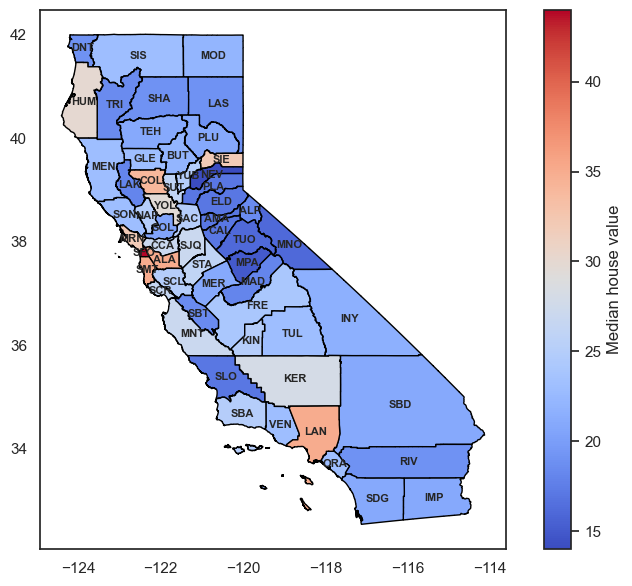

In [30]:
fig, ax = plt.subplots(figsize=(10, 7))

gdf_counties.plot(ax=ax, edgecolor="black", column="housing_median_age", cmap=PALETTE, legend=True,
                  legend_kwds={"label": "Median house value", "orientation": "vertical"})

for x, y, abbrev in zip(gdf_counties["centroid"].x, gdf_counties["centroid"].y, gdf_counties["abbrev"]):
    ax.text(x, y, abbrev, fontsize=8, ha="center", va="center", fontweight="bold")

plt.show()

Dessa vez, o olhar foi sobre a coluna **housing_median_age**, onde podemos ver os condados que possuem casas mais antigas.

#### Mapa para comparação de median_house_value e median_income

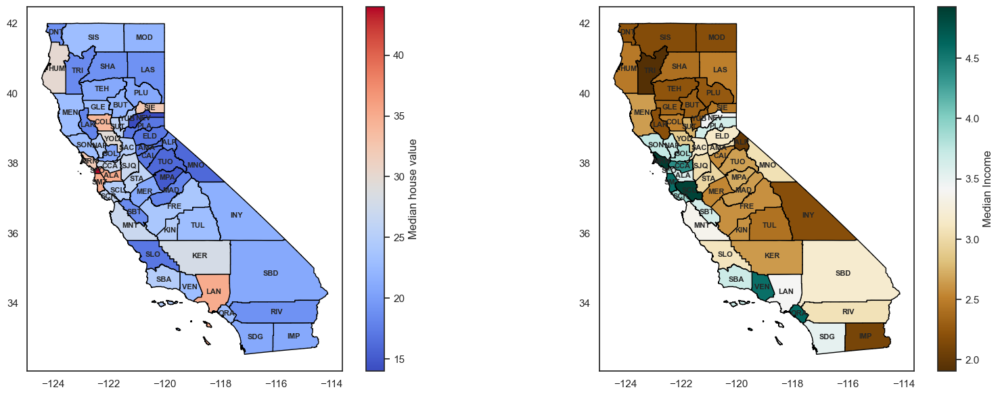

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(20, 7))

gdf_counties.plot(ax=axs[0], edgecolor="black", column="housing_median_age", cmap=PALETTE, legend=True,
                  legend_kwds={"label": "Median house value", "orientation": "vertical"})

gdf_counties.plot(ax=axs[1], edgecolor="black", column="median_income", cmap="BrBG", legend=True,
                  legend_kwds={"label": "Median Income", "orientation": "vertical"})

for x, y, abbrev in zip(gdf_counties["centroid"].x, gdf_counties["centroid"].y, gdf_counties["abbrev"]):
    axs[0].text(x, y, abbrev, fontsize=8, ha="center", va="center", fontweight="bold")
    axs[1].text(x, y, abbrev, fontsize=8, ha="center", va="center", fontweight="bold")

plt.show()

#### Salvando o gdf_counties no formato parquet, para uso posterior

In [32]:
gdf_counties.to_parquet(DADOS_GEO_MEDIAN)

#### Criando mapa interativo para comparar a coluna median_value_value

In [33]:
centro_mapa = [df["latitude"].mean(), df["longitude"].mean()]
tam_mapa_folium = {"width": 500, "height": 500}

with open(DADOS_GEO_ORIGINAIS, "r") as arquivo:
    geojson = json.load(arquivo)

In [34]:
fig = folium.Figure(**tam_mapa_folium)

mapa = folium.Map(location=centro_mapa, zoom_start=5, tiles="cartodb positron", control_scale=True).add_to(fig)

folium.Choropleth(geo_data=geojson, name="choropleth", data=gdf_counties, columns=["abbrev", "median_house_value"],
                  key_on="feature.properties.abbrev", fill_color="BrBG", legend_name="Median House Value", fill_opacity=0.7,
                  line_opacity=0.7).add_to(mapa)

folium.LayerControl().add_to(mapa)

folium.LatLngPopup().add_to(mapa)

plugins.MousePosition().add_to(mapa)

mapa